<a href="https://colab.research.google.com/github/RidhimaSinare/Dog_Breed_Classification/blob/main/dogvision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!unzip '/content/drive/MyDrive/dog vision/dog-breed-identification.zip' -d '/content/drive/MyDrive/dog vision/'

#End-to-end Multi-class Dog breed classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub

##1. Problem
Identifying the breed of a dog given an image of a dog

##2. Data
The data we are using is from Kaggle

##3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

##4. Features
Some information about the data:
* we are dealing with unstructured data(images) so its best to use deep learning or transfer learning.
* There are 120 breeds of dog i.e 120 different classes
* There are around 10,000+ images in training test and test set individually.
* train set has labels , test does not have labels


#Get workspace ready
* import tf
* import tf hub
* make sure we are using a gpu

In [ ]:
import pandas as pd
import numpy as np


In [ ]:
 #Import Tensorflow
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version: ",tf.__version__)
print("Hub version: ",hub.__version__)

#check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "Not available")

TF Version:  2.12.0
Hub version:  0.14.0
GPU available


#Getting our data ready into tensors
turning images into tensors(numerical rep)

* start by accessing data and checking out labels on data

In [ ]:
labels_csv=pd.read_csv("/content/drive/MyDrive/dog vision/labels.csv")
labels_csv.describe()
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


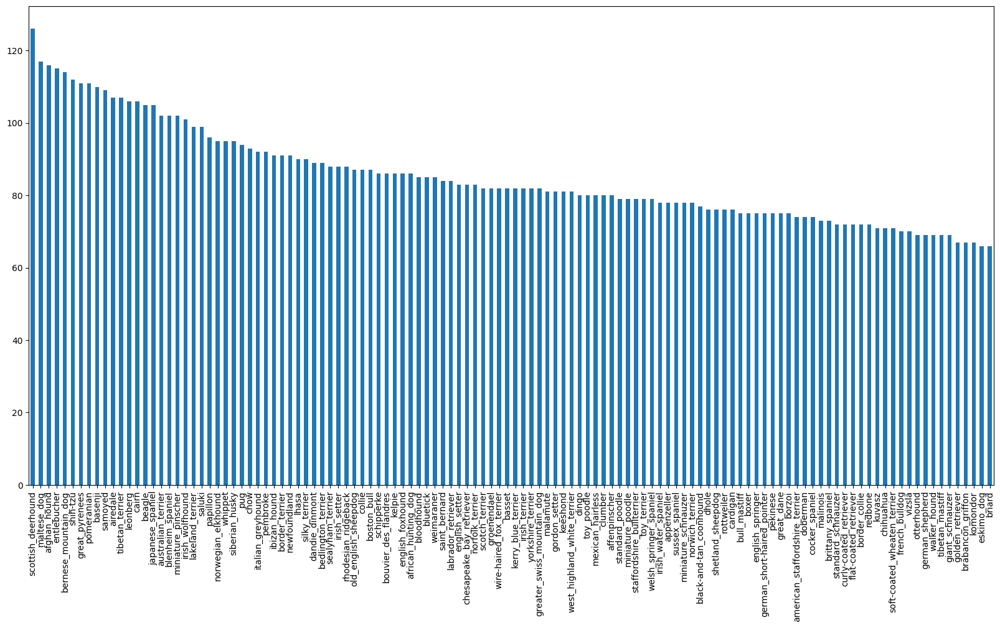

In [ ]:
#how many images of each breed
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

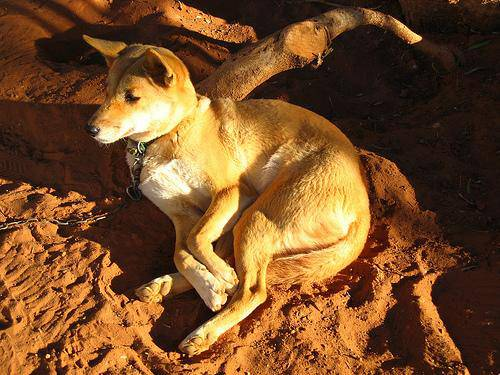

In [ ]:
#viewing an image
from IPython.display import Image
Image("drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

#Getting images and their labels
Lets get a list of all our images and file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#create pathnames from image
filenames=["drive/MyDrive/dog vision/train/"+fname +".jpg" for fname in labels_csv["id"]]
filenames

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/dog vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/dog vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/dog vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/dog vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
#check if number of filenames matches number of actual image files
import os
if(len(os.listdir("drive/MyDrive/dog vision/train/"))==len(filenames)):
  print('matches')
else:
  print("does not match")

matches


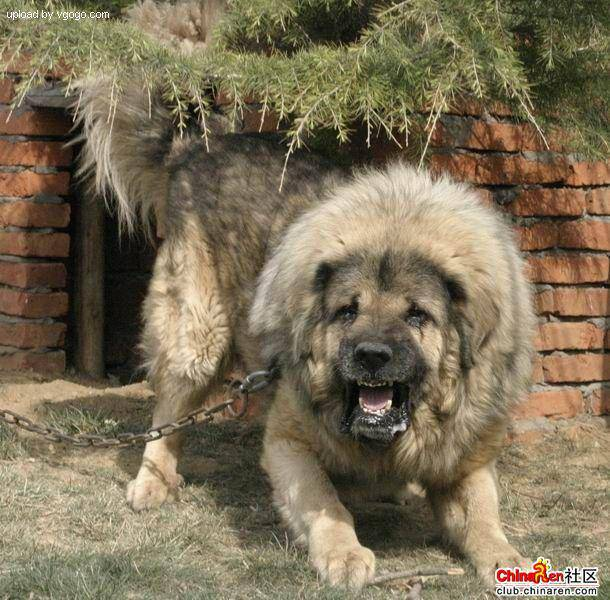

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we have now got our training image filepaths lets prepare our labels

In [ ]:
labels=labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
#see if labels matches number of filenames
if(len(labels)==len(filenames)):
  print("matches")
else:
  print("no match")

matches


In [ ]:
#find the unique label values
unique_breeds=np.unique(labels)
unique_breeds
len(unique_breeds)

120

In [ ]:
#turn a single label into array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#turn every label into boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]
len(boolean_labels)

10222

In [ ]:
boolean_labels[150].astype(int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

#Creating our own validation set

In [ ]:
#setup x and y variables
x=filenames
y=boolean_labels


We are going to start of experimenting with 1000 images

In [ ]:
#set number of images to be used
NUM_IMAGES=1000 # @param{type:"slider",min:1000,max:10000,step:1000}

In [ ]:
#lets split data into train and test split
from sklearn.model_selection import train_test_split

np.random.seed(42)

x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2)

len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
x_train[:2],y_train[:2]

(['drive/MyDrive/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

#Preprocessing images, turning them into tensors

* functions are written for this preprocessing
  * 1.Take an image filepath as input
  * 2.Use tensorflow to read the file and save it to a variable,image
  * 3.turn our image(a jpg) into tensor and hen normalize it (convert color channel values from 0-255 to 0-1)
  * 4.resize the image to be a size of (224,224)
  * 5.return the modified image

In [ ]:
#convert image to numpy array first
from matplotlib.pyplot import imread
image=imread(filenames[20])

In [ ]:
image.shape

(375, 500, 3)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[127, 128, 120],
        [123, 124, 116],
        [117, 120, 111],
        ...,
        [ 98, 123,  65],
        [ 97, 122,  64],
        [102, 127,  69]],

       [[117, 120, 111],
        [114, 117, 108],
        [112, 115, 106],
        ...,
        [ 97, 123,  62],
        [ 94, 119,  61],
        [ 98, 124,  63]],

       [[113, 118, 111],
        [111, 116, 109],
        [111, 116, 109],
        ...,
        [ 94, 120,  57],
        [ 90, 116,  55],
        [ 92, 118,  55]],

       ...,

       [[228, 227, 225],
        [231, 230, 228],
        [233, 227, 229],
        ...,
        [219, 214, 211],
        [202, 197, 194],
        [190, 185, 182]],

       [[221, 220, 218],
        [234, 233, 231],
        [243, 237, 239],
        ...,
        [222, 217, 214],
        [220, 215, 212],
        [217, 212, 209]],

       [[239, 238, 236],
        [236, 235, 233],
        [227, 221, 223],
        ...,
        [208, 203, 20

In [ ]:
#building function

#define image size
img_size=224

def process_image(image_path):
  """
  Takes an image filepath and turns image into a tensor

  """
  image=tf.io.read_file(image_path)

  #turn jpeg image into numerical tensor with 3 color channels(RGB)
  image=tf.image.decode_jpeg(image,channels=3)

  #convert color channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)

  #resize image
  image=tf.image.resize(image,size=[img_size,img_size])

  return image


In [ ]:
tensor=tf.io.read_file(filenames[26])
tensor=tf.image.decode_jpeg(tensor,channels=3)
tf.image.convert_image_dtype(tensor,tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

#Turning data into batches
* Q)Why?
all 10,000 images not fit into memory

* about 32 batch size(manually adjustable)
* we need our data to look in the form of tensor tuples to use tf

In [ ]:
#create simple function to return a tuple of tensors

def get_image_label(image_path,label):
  image=process_image(image_path)

  return image,label

In [ ]:
(process_image(x[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have a way to turn daa into tuples or tensors in form (image,label). Lets make a function o turn all data into batches

In [ ]:
#define batch size, here 32
BATCH_SIZE=32

#create function to turn data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """creates batches of data out of image x and label y. shuffles data if its training not if validation"""
  #if data is a test dataset , we mostly dont have labels

  if test_data: #only filepaths no labels
    print("creating test data batches: ")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch=data.map(process_image).bach(BATCH_SIZE)
    return data_batch

  elif valid_data: # no shuffling
    print("creating validation data batches:")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("creating training data batches: ")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))

    data=data.shuffle(buffer_size=len(x))

    data=data.map(get_image_label)

    data_batch=data.batch(BATCH_SIZE)
    return data_batch



In [ ]:
#creating training and validation batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

creating training data batches: 
creating validation data batches:


In [ ]:
#checking attributes
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

Visualizing images

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images,labels):

  plt.figure(figsize=(10,10))

  for i in range(25):

    ax=plt.subplot(5,5,i+1)

    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


In [ ]:
#de batching data to use
train_images,train_labels=next(train_data.as_numpy_iterator())

len(train_images),len(train_labels)

(32, 32)

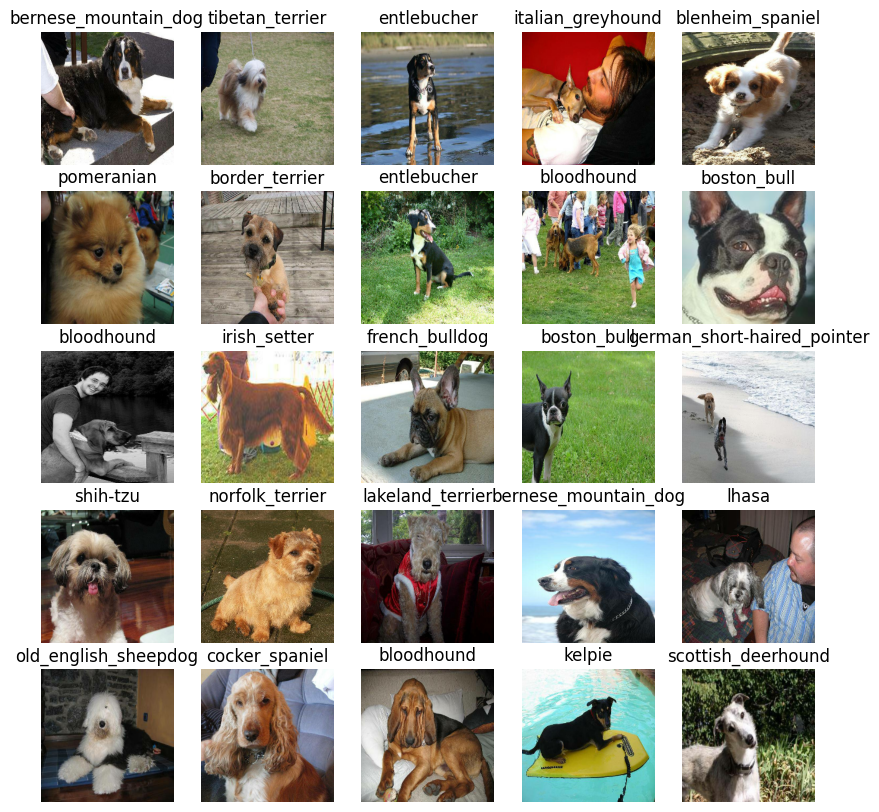

In [ ]:
#visualizing training batch
show_25_images(train_images,train_labels)

In [ ]:
#visualizing validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
len(val_images)

32

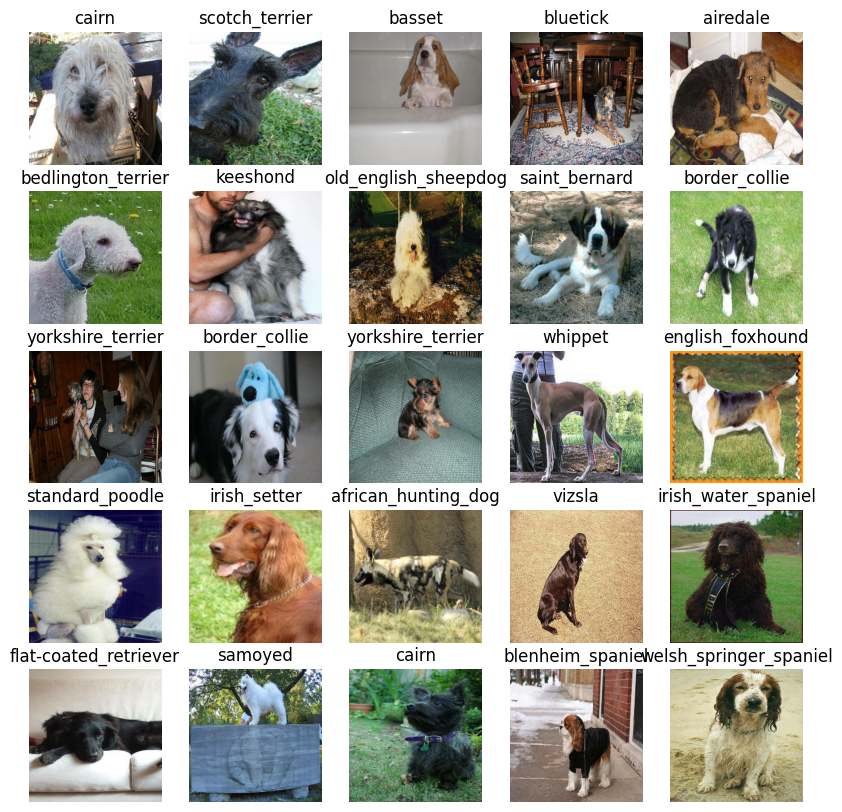

In [ ]:
show_25_images(val_images,val_labels)

Before we build a model we need to define following things:
* Input shape(of images in form of tensors)
* output shape
* URL of the model we want to use from Tensorflow Hub
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
img_size

224

In [ ]:
#setup input input shape to the model
INPUT_SHAPE =[None,img_size,img_size,3]

#setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

#setup model URL from TensorFlow Hub
MODEL_URL= "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
#create function to build a keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):

  #setup model layers
  model=tf.keras.Sequential(
      [
          hub.KerasLayer(MODEL_URL),
          tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")
      ]
  )

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)

  return model

In [ ]:
model=create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

* we'll create 2 models: 1 for tensorboard which helps track our models progress and other for early stopping to prevent model from training for too long

#TensorBoard Callback

* to setup a tensorboard callback,we need to do 3 things:
  * 1. load tensorboard notebook extension
  * 2. create a tensorboard callback whihc is able to save logs to a directory and pass it to our models fit()function
  * 3. visualize our trainng models with the %tensorboard magic function

In [ ]:
#load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#create func o build tensorboard callback

def create_tensorboard_callback():
  #create log directory to store logs
  #this is gonna create a path/log with the name of current date time everytime the function
  # is called

  logdir=os.path.join("drive/MyDrive/dogvision/logs/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

#Early stopping callback

helps stop our model from overfiting if certain evaluation metrics stops improving

In [ ]:
early_stopping_callback=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

#Training a model

first model trained on 1000 images

In [ ]:
NUM_EPOCHS=100 # @param{type:"slider",min:10,max:100,step:10}

In [ ]:
#check to make sure we are sill running on gpu
print(tf.config.list_physical_devices("GPU"))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


#creating a function which trains the model

* create model using create_model()
* setup tensorboard callback
* call the fit() on our model
* return model

In [ ]:
def train_model():

  model=create_model()

  tensorboard=create_tensorboard_callback()

  model.fit(x=train_data,validation_data=val_data,epochs=NUM_EPOCHS,
            validation_freq=1,callbacks=[tensorboard,early_stopping_callback])

  return model

In [ ]:
model=train_model()

Epoch 1/100
25/25 [==============================] - 350s 13s/step - loss: 4.5778 - accuracy: 0.1100 - val_loss: 3.4377 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 3s 122ms/step - loss: 1.6414 - accuracy: 0.6800 - val_loss: 2.2321 - val_accuracy: 0.4550
Epoch 3/100
25/25 [==============================] - 4s 139ms/step - loss: 0.5738 - accuracy: 0.9325 - val_loss: 1.7322 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 5s 190ms/step - loss: 0.2483 - accuracy: 0.9900 - val_loss: 1.5223 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 3s 126ms/step - loss: 0.1452 - accuracy: 0.9987 - val_loss: 1.4279 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 4s 148ms/step - loss: 0.0999 - accuracy: 1.0000 - val_loss: 1.3923 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================] - 4s 164ms/step - loss: 0.0750 - accuracy: 1.0000 - val_loss: 1.3716 - val_accuracy: 0.6300

Looks like model is overfitting as it performs better on the training dataset than the val dataset.
ways to prevent model overfitting in deep learning ?

*

#checking tensorboard logs
The tensorboard magic func (%tensorboard) will access logs dir and visualize its content

In [ ]:
%tensorboard --logdir drive/MyDrive/dogvision/logs/logs

<IPython.core.display.Javascript object>

#making and evaluting predictions using trained model

In [ ]:
#make predic on val data

predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 162ms/step


array([[1.6728897e-03, 1.2392300e-04, 7.7756215e-04, ..., 2.1658053e-04,
        2.1039052e-05, 2.4357736e-03],
       [2.2968897e-03, 1.4756451e-04, 6.3029169e-03, ..., 3.2805456e-04,
        3.2594707e-04, 5.9165435e-05],
       [1.3948886e-06, 2.7218717e-05, 4.5129013e-06, ..., 1.4516938e-05,
        2.0598429e-06, 1.1357455e-04],
       ...,
       [7.5046910e-06, 2.9492216e-05, 2.5826390e-05, ..., 1.2117845e-05,
        1.2574882e-04, 7.6926422e-05],
       [8.3293011e-03, 1.5336515e-04, 1.7594817e-04, ..., 5.0069700e-04,
        2.8229466e-05, 2.8848531e-02],
       [1.4761557e-04, 1.5691665e-05, 4.9982109e-04, ..., 1.0998630e-03,
        1.9980997e-03, 1.3642259e-05]], dtype=float32)

In [ ]:
predictions.shape #200 arrays of 120 really small numbers

(200, 120)

In [ ]:
len(y_val),len(unique_breeds)

(200, 120)

In [ ]:
np.sum(predictions[0])  #because of softmax activation

0.99999994

In [ ]:
#first predictions
index=0
print(predictions[0])
print(f"max value (probability of prediction): np.max(predictions[0])")
print(f"{np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")

[1.67288969e-03 1.23923004e-04 7.77562149e-04 3.35725381e-05
 3.01739055e-04 1.00486586e-05 3.35668698e-02 1.38513092e-03
 2.43835093e-05 5.47404998e-05 3.46982037e-04 1.64276804e-04
 1.13777875e-03 5.14279163e-05 3.17745231e-04 2.00455397e-04
 4.28922736e-04 1.99706018e-01 1.32590194e-05 1.11887770e-04
 7.43067765e-04 7.73988286e-05 2.35861717e-06 5.18140674e-04
 5.30096804e-05 9.57606462e-05 2.32407212e-01 8.92270764e-05
 2.63748487e-04 1.38210133e-04 1.48408959e-04 4.01912443e-03
 9.25071479e-04 1.24500912e-05 1.01401078e-04 3.12646665e-02
 3.80548627e-05 1.76600661e-04 2.37442451e-04 5.33319762e-05
 1.02325657e-03 1.01067371e-05 1.08518114e-04 1.97979622e-04
 1.92290499e-05 8.71246521e-05 3.71636452e-05 1.74951565e-04
 1.45443919e-04 9.22932813e-05 6.88284868e-04 2.68879885e-05
 7.82805728e-05 9.45382781e-05 1.22487269e-04 6.34802927e-05
 2.21208655e-04 5.82525739e-03 1.54502771e-03 1.63622856e-01
 1.09519489e-04 6.44594256e-05 2.86848866e-03 2.09909940e-05
 3.68553650e-04 1.937672

scaling the functionality and displaying image

In [ ]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label=get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:

* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)


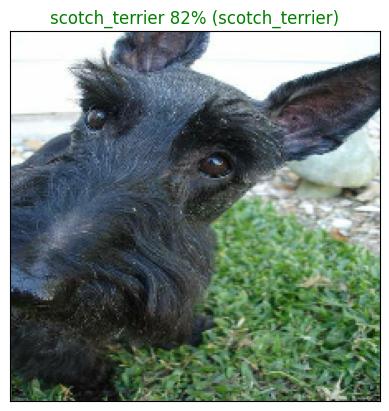

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Let's build a function to demonstrate. The function will:

Take an input of a prediction probabilities array, a ground truth labels array and an integer.
Find the predicted label using get_pred_label().
Find the top 10:
Prediction probabilities indexes
Prediction probabilities values
Prediction labels
Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

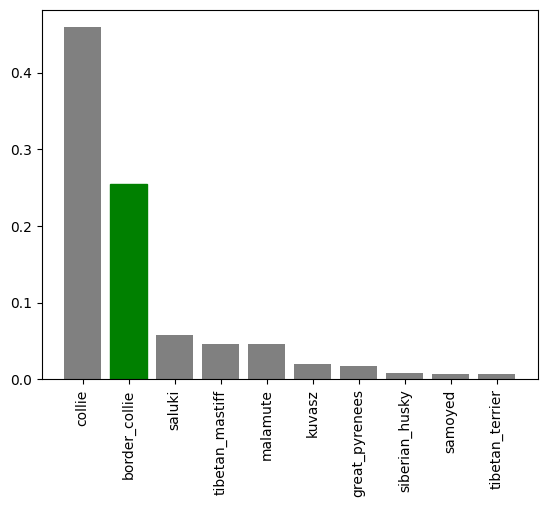

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

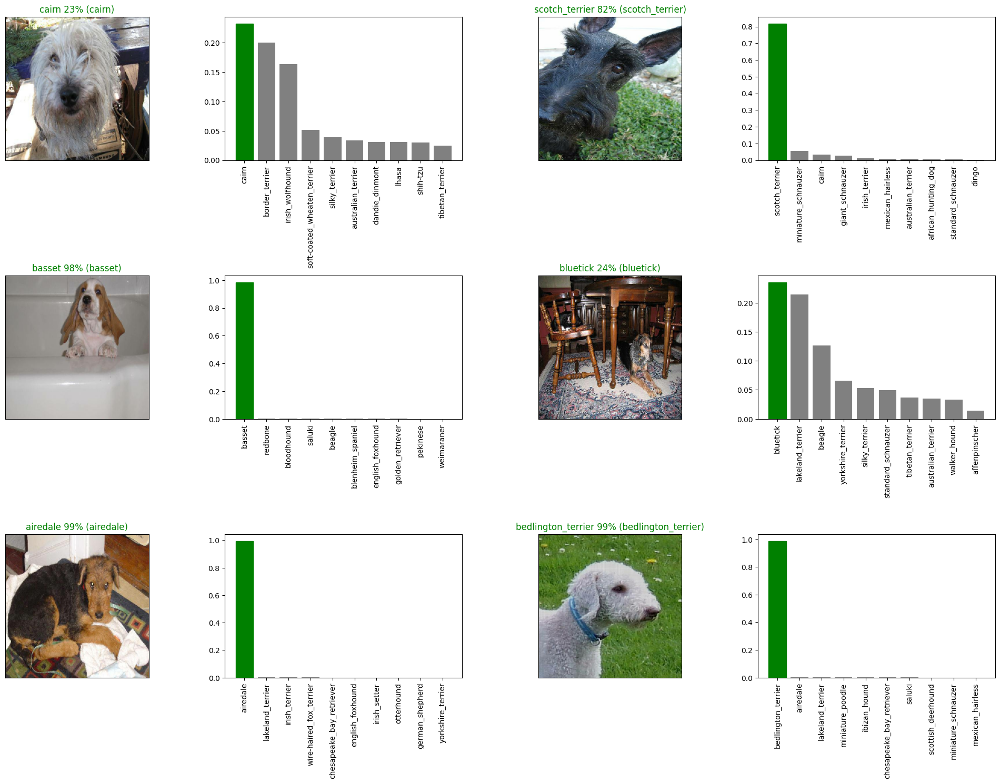

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

#Saving and reloading model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/MyDrive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/MyDrive/Data/models/20230901-05561693547801-1000-images-Adam.h5...


'drive/MyDrive/Data/models/20230901-05561693547801-1000-images-Adam.h5'

In [ ]:
# Load our model trained on 1000 images
model_1000_images = load_model('/content/drive/MyDrive/Data/models/20230901-05561693547762-1000-images-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Data/models/20230901-05561693547762-1000-images-Adam.h5
